Code for **"Inpainting"** figures $6$, $8$ and 7 (top) from the main paper. 

In [75]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
# !git clone https://github.com/DmitryUlyanov/deep-image-prior
# !mv deep-image-prior/* ./

'\n*Uncomment if running on colab* \nSet Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab \n'

# Import libs

In [76]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
import torch
import torch.optim

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.FloatTensor #dtype = torch.cuda.FloatTensor

PLOT = True
imsize = -1
dim_div_by = 64

# Choose figure

In [77]:
## Fig 6
# img_path  = 'data/inpainting/vase.png'
# mask_path = 'data/inpainting/vase_mask.png'

## Fig 8
# img_path  = 'data/inpainting/library.png'
# mask_path = 'data/inpainting/library_mask.png'

## Fig 7 (top)
#img_path  = 'data/inpainting/kate.png'
#mask_path = 'data/inpainting/kate_mask.png'

## Our Fig
img_path  = '../Our_data/tetra2.png'
mask_path = '../Our_data/tetra2_mask.png'

# Another text inpainting example
# img_path  = 'data/inpainting/peppers.png'
# mask_path = 'data/inpainting/peppers_mask.png'

NET_TYPE = 'skip_depth6' # one of skip_depth4|skip_depth2|UNET|ResNet

# Load mask

In [78]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)

### Center crop

In [79]:
img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)

### Visualize

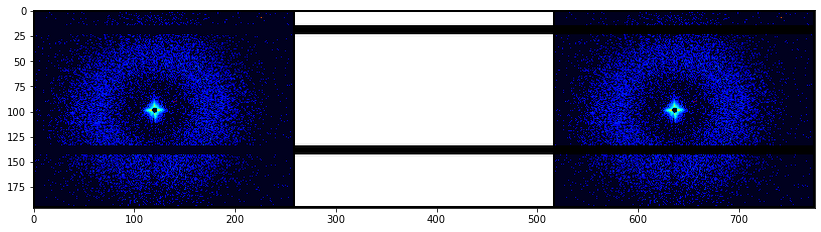

In [80]:
img_mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

# Setup

In [81]:
pad = 'reflection' # 'zero'
OPT_OVER = 'net'
OPTIMIZER = 'adam'

In [82]:
if 'vase.png' in img_path:
    INPUT = 'meshgrid'
    input_depth = 2
    LR = 0.01 
    num_iter = 5001
    param_noise = False
    show_every = 50
    figsize = 5
    reg_noise_std = 0.03
    
    net = skip(input_depth, img_np.shape[0], 
               num_channels_down = [128] * 5,
               num_channels_up   = [128] * 5,
               num_channels_skip = [0] * 5,  
               upsample_mode='nearest', filter_skip_size=1, filter_size_up=3, filter_size_down=3,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)
    
elif ('kate.png' in img_path) or ('peppers.png' in img_path) or ('tetra2.png' in img_path):
    # Same params and net as in super-resolution and denoising
    INPUT = 'noise'
    input_depth = 32
    LR = 0.01 
    num_iter = 500 # 6001 originally
    param_noise = False
    show_every = int(num_iter/20)
    figsize = 5
    reg_noise_std = 0.03
    
    net = skip(input_depth, img_np.shape[0], 
               num_channels_down = [128] * 5,
               num_channels_up =   [128] * 5,
               num_channels_skip =    [128] * 5,  
               filter_size_up = 3, filter_size_down = 3, 
               upsample_mode='nearest', filter_skip_size=1,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)
    
elif 'library.png' in img_path:
    
    INPUT = 'noise'
    input_depth = 1
    
    num_iter = 3001
    show_every = 50
    figsize = 8
    reg_noise_std = 0.00
    param_noise = True
    
    if 'skip' in NET_TYPE:
        
        depth = int(NET_TYPE[-1])
        net = skip(input_depth, img_np.shape[0], 
               num_channels_down = [16, 32, 64, 128, 128, 128][:depth],
               num_channels_up =   [16, 32, 64, 128, 128, 128][:depth],
               num_channels_skip =    [0, 0, 0, 0, 0, 0][:depth],  
               filter_size_up = 3,filter_size_down = 5,  filter_skip_size=1,
               upsample_mode='nearest', # downsample_mode='avg',
               need1x1_up=False,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)
        
        LR = 0.01 
        
    elif NET_TYPE == 'UNET':
        
        net = UNet(num_input_channels=input_depth, num_output_channels=3, 
                   feature_scale=8, more_layers=1, 
                   concat_x=False, upsample_mode='deconv', 
                   pad='zero', norm_layer=torch.nn.InstanceNorm2d, need_sigmoid=True, need_bias=True)
        
        LR = 0.001
        param_noise = False
        
    elif NET_TYPE == 'ResNet':
        
        net = ResNet(input_depth, img_np.shape[0], 8, 32, need_sigmoid=True, act_fun='LeakyReLU')
        
        LR = 0.001
        param_noise = False
        
    else:
        assert False
else:
    assert False

net = net.type(dtype)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype)

In [83]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)

Number of params: 3002627


# Main loop

  0%|          | 0/500 [00:00<?, ?it/s]Starting optimization with ADAM


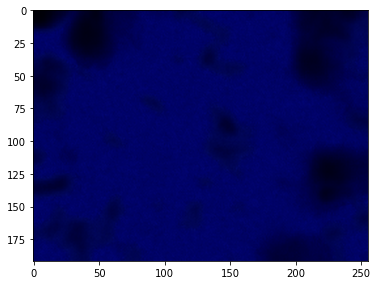

  0%|          | 1/500 [00:03<27:55,  3.36s/it]

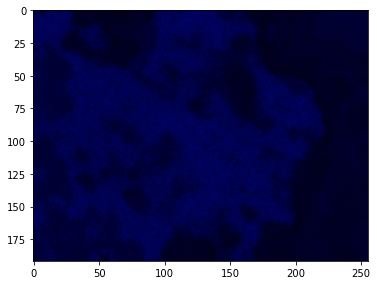

  0%|          | 2/500 [00:06<28:04,  3.38s/it]

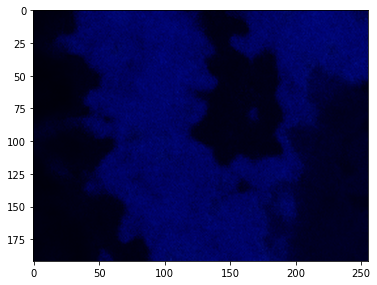

  1%|          | 3/500 [00:10<29:44,  3.59s/it]

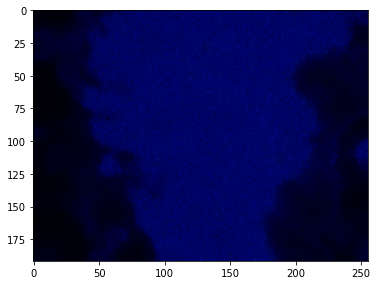

  1%|          | 4/500 [00:14<29:35,  3.58s/it]

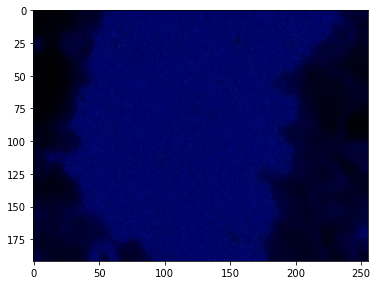

  1%|          | 5/500 [00:17<29:27,  3.57s/it]

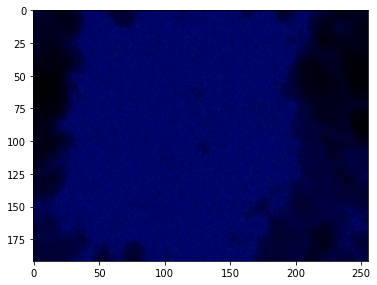

  1%|          | 6/500 [00:21<29:28,  3.58s/it]

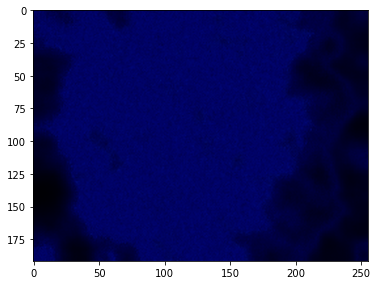

  1%|▏         | 7/500 [00:25<29:40,  3.61s/it]

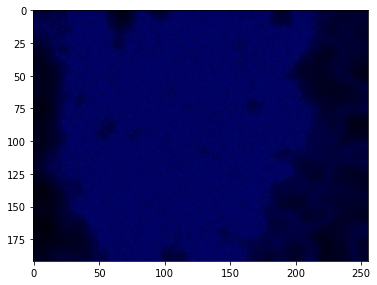

  2%|▏         | 8/500 [00:28<29:14,  3.57s/it]

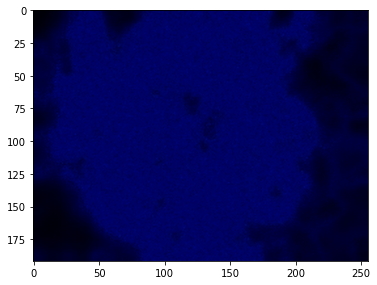

  2%|▏         | 9/500 [00:32<29:00,  3.54s/it]

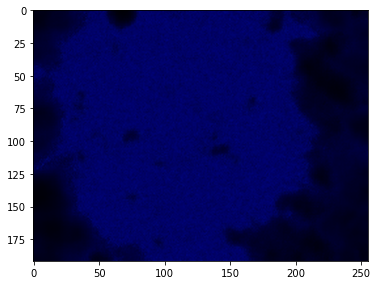

  2%|▏         | 10/500 [00:35<28:48,  3.53s/it]

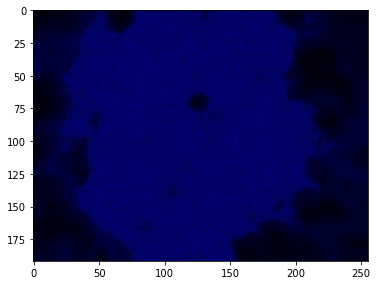

  2%|▏         | 11/500 [00:39<29:11,  3.58s/it]

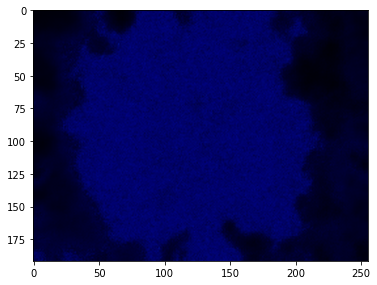

  2%|▏         | 12/500 [00:42<28:57,  3.56s/it]

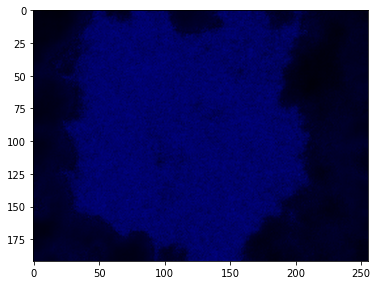

  3%|▎         | 13/500 [00:46<28:45,  3.54s/it]

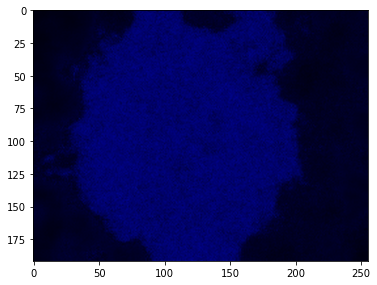

  3%|▎         | 14/500 [00:49<28:34,  3.53s/it]

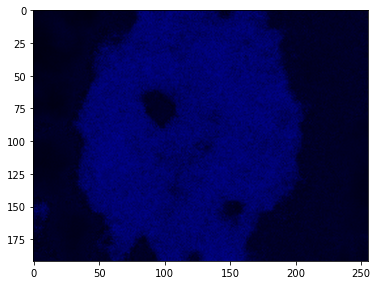

  3%|▎         | 15/500 [00:53<28:29,  3.53s/it]

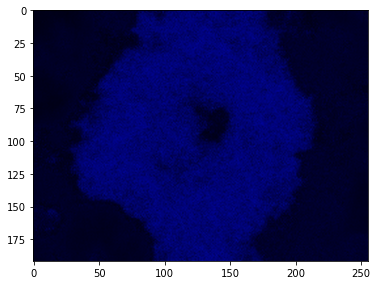

  3%|▎         | 16/500 [00:56<28:25,  3.52s/it]

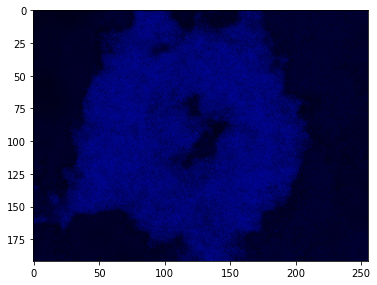

  3%|▎         | 17/500 [01:00<28:54,  3.59s/it]

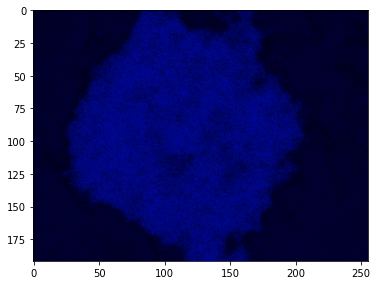

  4%|▎         | 18/500 [01:04<28:49,  3.59s/it]

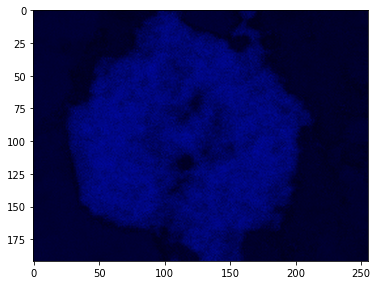

  4%|▍         | 19/500 [01:07<28:47,  3.59s/it]

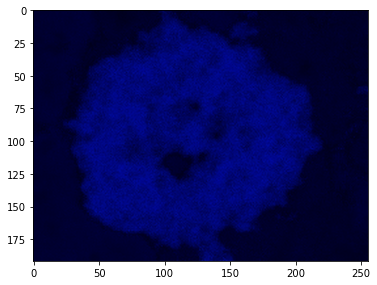

  4%|▍         | 20/500 [01:11<28:29,  3.56s/it]

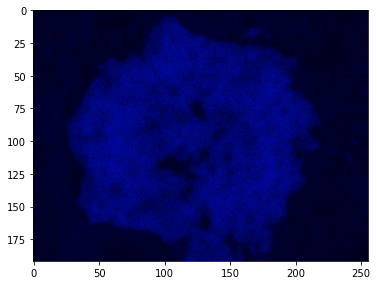

  4%|▍         | 21/500 [01:15<28:46,  3.60s/it]

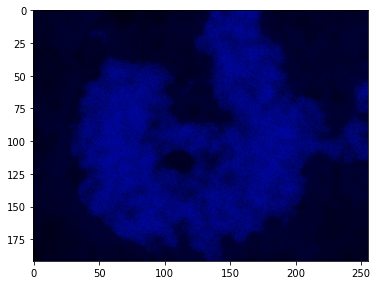

  4%|▍         | 22/500 [01:18<28:48,  3.62s/it]

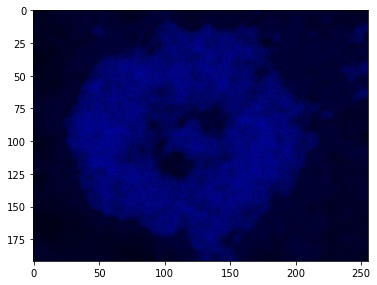

  5%|▍         | 23/500 [01:22<28:43,  3.61s/it]

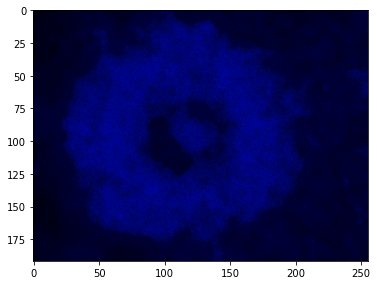

  5%|▍         | 24/500 [01:25<28:32,  3.60s/it]

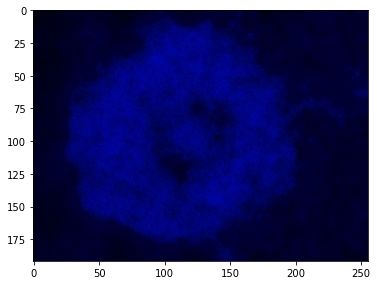

  5%|▌         | 25/500 [01:29<28:34,  3.61s/it]

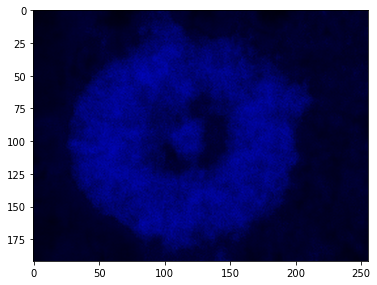

  5%|▌         | 26/500 [01:33<28:31,  3.61s/it]

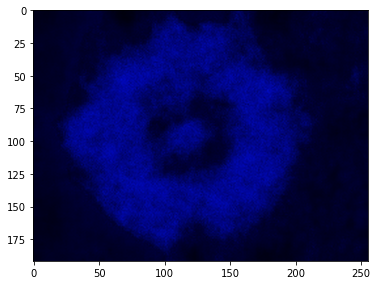

  5%|▌         | 27/500 [01:36<28:30,  3.62s/it]

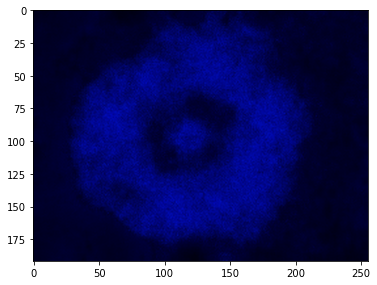

  6%|▌         | 28/500 [01:40<28:22,  3.61s/it]

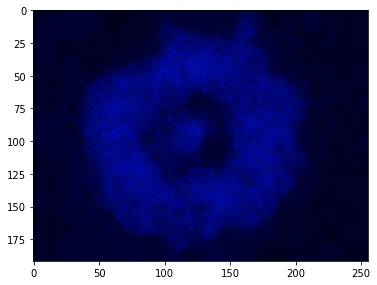

  6%|▌         | 29/500 [01:44<28:42,  3.66s/it]

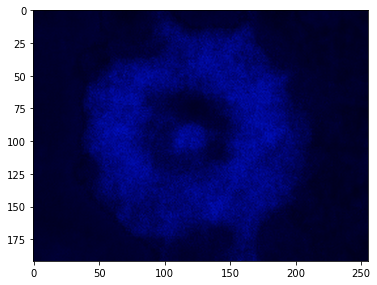

  6%|▌         | 30/500 [01:47<28:25,  3.63s/it]

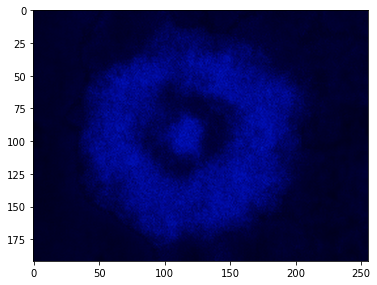

  6%|▌         | 31/500 [01:51<28:46,  3.68s/it]

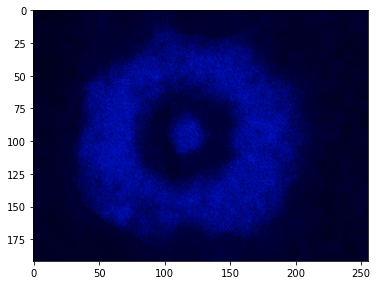

  6%|▋         | 32/500 [01:55<28:38,  3.67s/it]

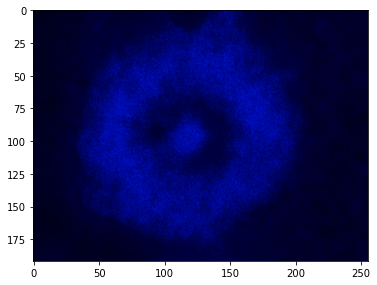

  7%|▋         | 33/500 [01:58<28:34,  3.67s/it]

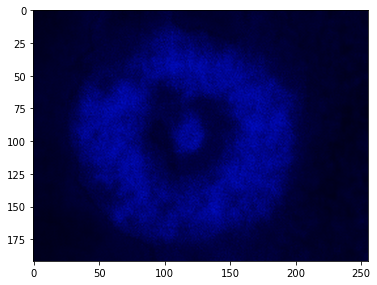

  7%|▋         | 34/500 [02:02<28:07,  3.62s/it]

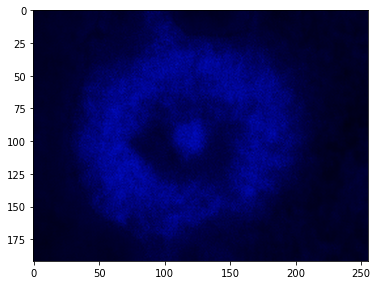

  7%|▋         | 35/500 [02:05<28:10,  3.63s/it]

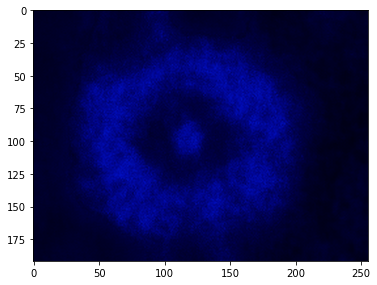

  7%|▋         | 36/500 [02:09<28:16,  3.66s/it]

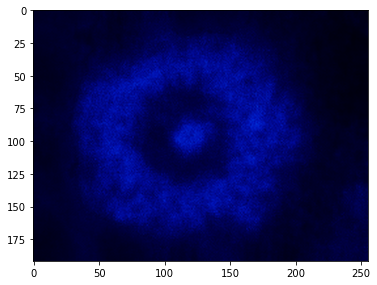

  7%|▋         | 37/500 [02:13<27:45,  3.60s/it]

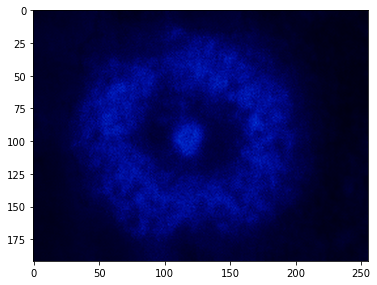

  8%|▊         | 38/500 [02:16<27:26,  3.56s/it]

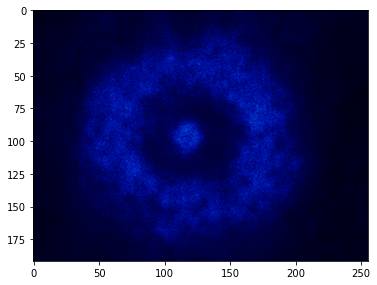

  8%|▊         | 39/500 [02:20<27:23,  3.56s/it]

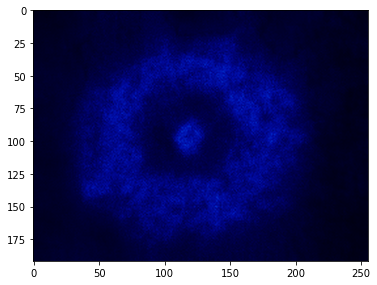

  8%|▊         | 40/500 [02:23<27:25,  3.58s/it]

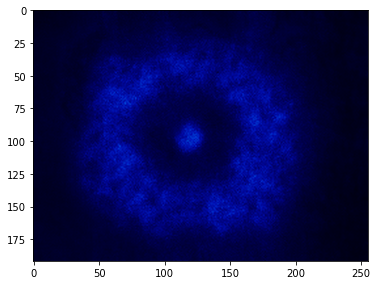

  8%|▊         | 41/500 [02:27<27:24,  3.58s/it]

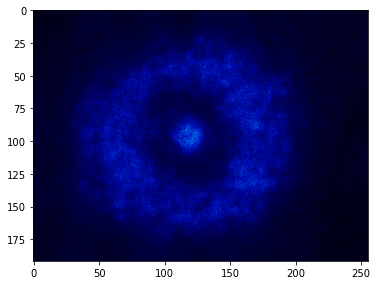

  8%|▊         | 42/500 [02:31<27:23,  3.59s/it]

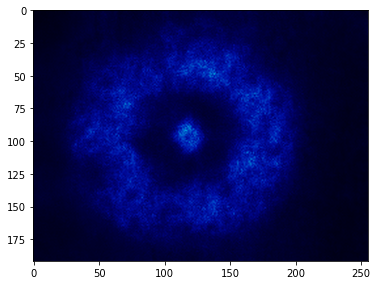

  9%|▊         | 43/500 [02:36<27:38,  3.63s/it]


KeyboardInterrupt: 

In [87]:
i = 0
def closure():
    
    global i
    
    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        
        
    out = net(net_input)
   
    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()
        
    #print('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)
        
    i += 1

    return total_loss

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [ ]:
out_np = torch_to_np(net(net_input))
plot_image_grid([out_np], factor=5);